In [1]:
# reload packages
%load_ext autoreload
%autoreload 2

### Choose GPU

In [2]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=1

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=1


In [3]:
import tensorflow as tf
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices)>0:
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
print(gpu_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
tf.keras.backend.clear_session()

### Load packages

In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm
from IPython import display
import pandas as pd
import umap
import copy
import os, tempfile
from datetime import datetime

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### Load dataset

In [6]:
dataset = 'fmnist'
dims = (28,28,1)
umap_prop = 0.0
num_classes = 10
PROJECTION_DIMS = 128
labels_per_class = 3 #'full'


In [7]:
from tfumap.load_datasets import load_FMNIST, mask_labels

In [8]:
X_train, X_test, X_valid, Y_train, Y_test, Y_valid = load_FMNIST(flatten=False)
X_train.shape

(50000, 28, 28, 1)

In [9]:
if labels_per_class == "full":
    X_labeled = X_train
    Y_labeled = Y_train
    Y_masked = np.ones(len(Y_train))
else:
    X_labeled, Y_labeled, Y_masked = mask_labels(
        X_train, Y_train, labels_per_class=labels_per_class
    )

### Build umap graph

In [10]:
from tfumap.semisupervised import build_fuzzy_simplicial_set

In [11]:
n_neighbors = 15  # default = 15
umap_graph = build_fuzzy_simplicial_set(
    X_train.reshape((len(X_train), np.product(np.shape(X_train)[1:]))),
    y=Y_masked,
    n_neighbors=n_neighbors,
)

### Build data iterators

In [12]:
from tfumap.umap import compute_cross_entropy, get_graph_elements
from tfumap.semisupervised import create_edge_iterator, create_validation_iterator, create_classification_iterator

In [13]:
n_epochs = 200
graph, epochs_per_sample, head, tail, weight, n_vertices = get_graph_elements(
            umap_graph, n_epochs
)
batch_size = np.min([n_vertices, 1000])
batch_size

1000

In [14]:
labeled_iter = create_classification_iterator(X_labeled, Y_labeled, batch_size=batch_size)

In [15]:
max_sample_repeats_per_epoch = 25
edge_iter, n_edges_per_epoch = create_edge_iterator(
    head,
    tail,
    weight,
    batch_size=batch_size,
    max_sample_repeats_per_epoch=max_sample_repeats_per_epoch,
)

In [16]:
data_valid, n_valid_samp = create_validation_iterator(X_valid, Y_valid, batch_size, repeat=True)

### Build network

In [17]:
encoder = tf.keras.Sequential()

encoder.add(tf.keras.layers.InputLayer(input_shape=dims))

# Conv + Maxpooling
encoder.add(tf.keras.layers.Convolution2D(64, (4, 4), padding='same', activation='relu'))
encoder.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))

# Dropout
encoder.add(tf.keras.layers.Dropout(0.1))

# Conv + Maxpooling
encoder.add(tf.keras.layers.Convolution2D(64, (4, 4), activation='relu'))
encoder.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2)))

# Dropout
encoder.add(tf.keras.layers.Dropout(0.3))

# Converting 3D feature to 1D feature Vektor
encoder.add(tf.keras.layers.Flatten())

# Fully Connected Layer
encoder.add(tf.keras.layers.Dense(256, activation='relu'))

# Dropout
encoder.add(tf.keras.layers.Dropout(0.5))

In [18]:
classifier = tf.keras.Sequential()
classifier.add(tf.keras.layers.InputLayer(input_shape=256))
# Normalization
classifier.add(tf.keras.layers.Dense(64, activation='relu'))
classifier.add(tf.keras.layers.Dense(num_classes, activation='softmax', name="predictions"))

In [19]:
embedder = tf.keras.Sequential()
embedder.add(tf.keras.Input(shape=(256)))
embedder.add(tf.keras.layers.Dense(units=64, activation="relu"))
embedder.add(tf.keras.layers.Dense(PROJECTION_DIMS, activation=None, name='z'))

In [20]:
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 64)        1088      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 11, 11, 64)        65600     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 5, 5, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1600)              0

### Create UMAP object

In [21]:
from tfumap.semisupervised_model import PUMAP, compute_classifier_loss

In [22]:
tf.keras.backend.clear_session()
tf.compat.v1.global_variables_initializer()
tf.compat.v1.reset_default_graph()

In [23]:
### Initialize model
model = PUMAP(
    min_dist = 0.0,
    negative_sample_rate = 5, # how many negative samples per positive
    optimizer=tf.keras.optimizers.Adam(1e-3), # cross-entropy optimizer
    encoder=encoder,
    embedder=embedder,
    classifier=classifier,
    umap_prop=umap_prop
    
)

### plotting results

In [24]:
from tfumap.semisupervised_plotting import plot_umap_classif_results, plot_results, get_decision_contour

No objects to concatenate


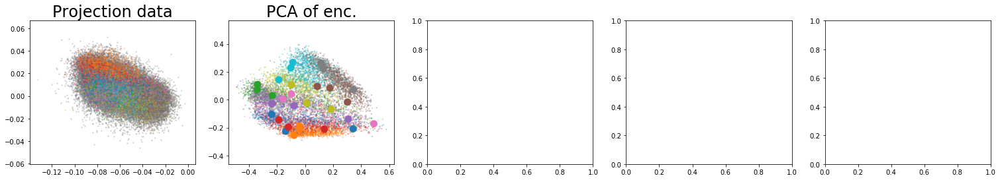

In [25]:
plot_umap_classif_results(model, X_valid, Y_valid, X_train, X_labeled, Y_labeled, batch_size, cmap='tab10', cmap2='tab10')

### Train model

In [26]:
batch = 0; epoch = 0
N_EPOCHS = 10
BATCHES_PER_EPOCH = int(n_edges_per_epoch / batch_size)

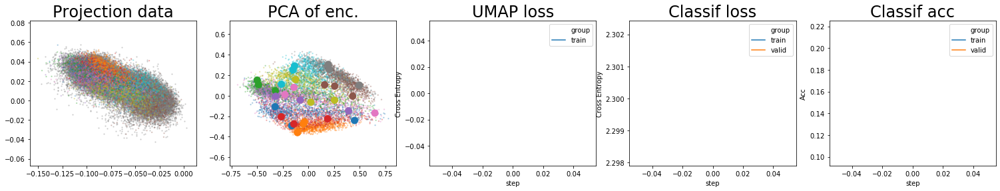

train acc: 0.098 | val acc: 0.219


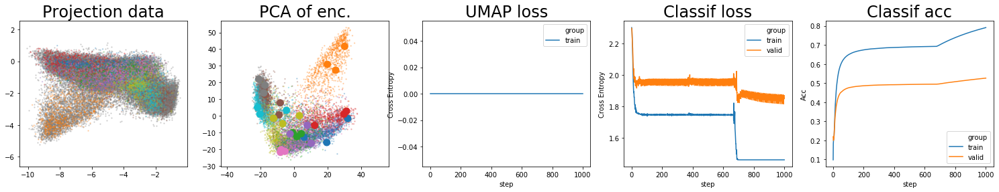

train acc: 0.7908 | val acc: 0.526


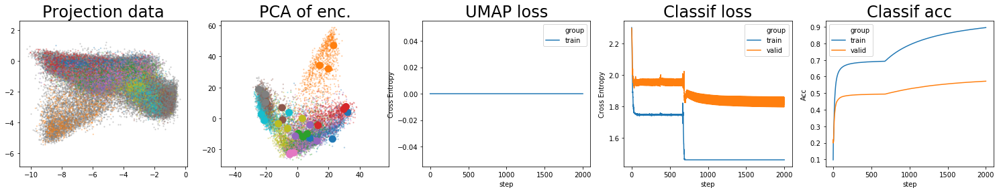

train acc: 0.8954 | val acc: 0.5722


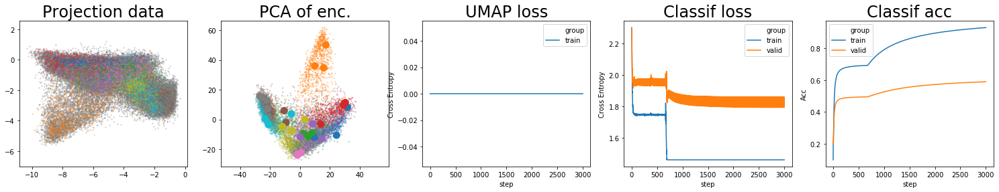

train acc: 0.9302 | val acc: 0.5893


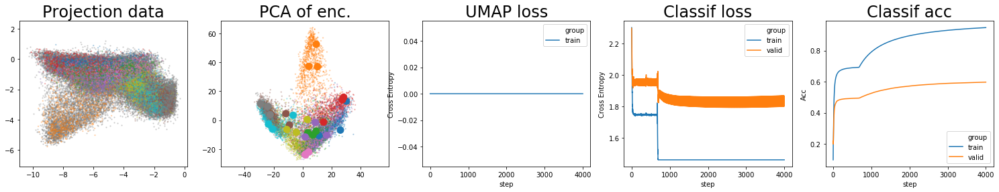

train acc: 0.9477 | val acc: 0.5973


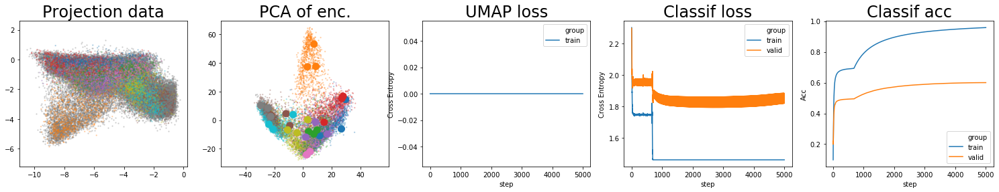

train acc: 0.9581 | val acc: 0.6002


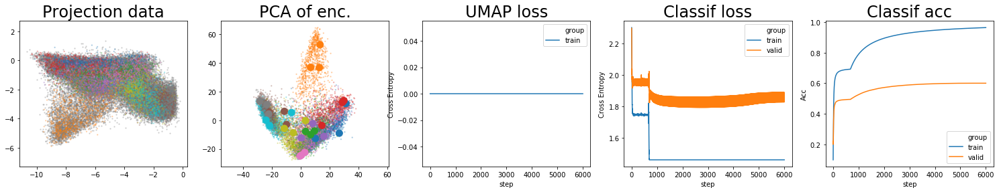

train acc: 0.9651 | val acc: 0.6004


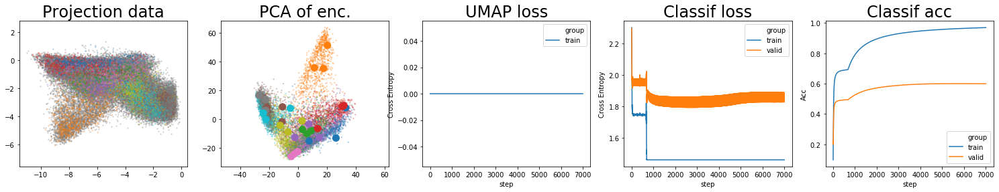

train acc: 0.9701 | val acc: 0.6


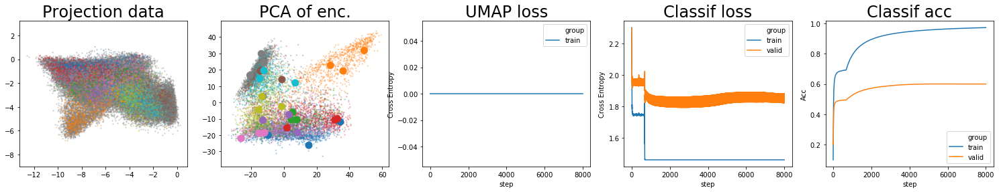

train acc: 0.9738 | val acc: 0.6002


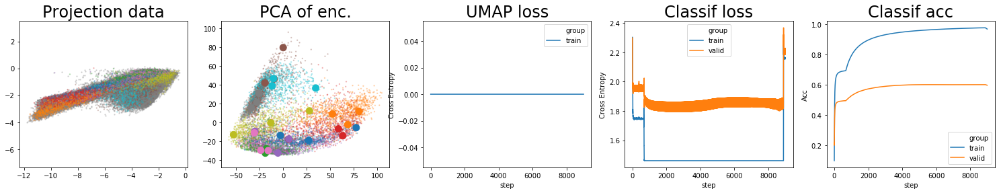

train acc: 0.968 | val acc: 0.5965


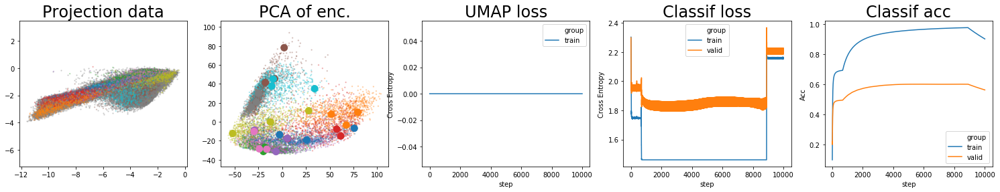

train acc: 0.9012 | val acc: 0.5624


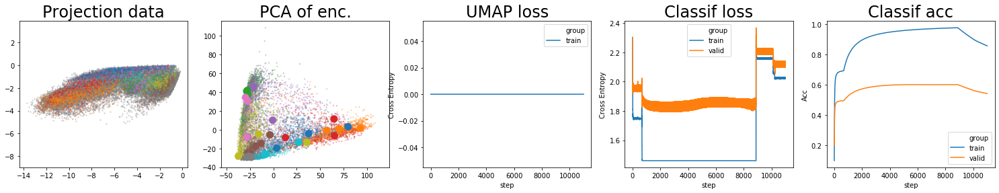

train acc: 0.8569 | val acc: 0.5414


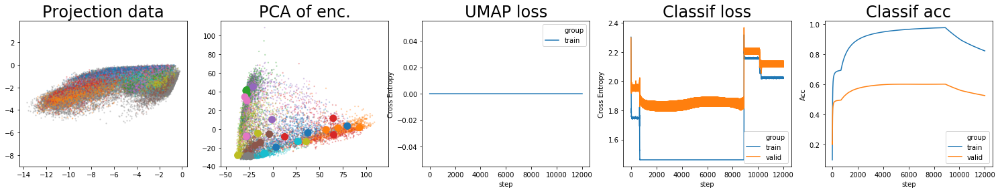

train acc: 0.8216 | val acc: 0.5249


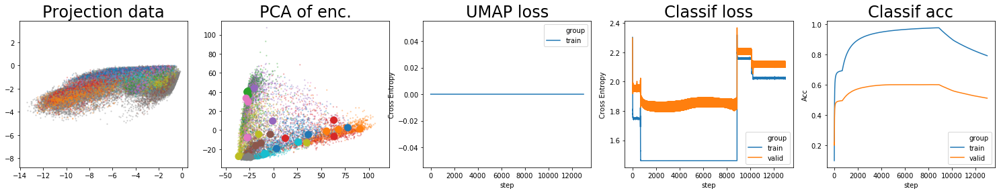

train acc: 0.7917 | val acc: 0.5108


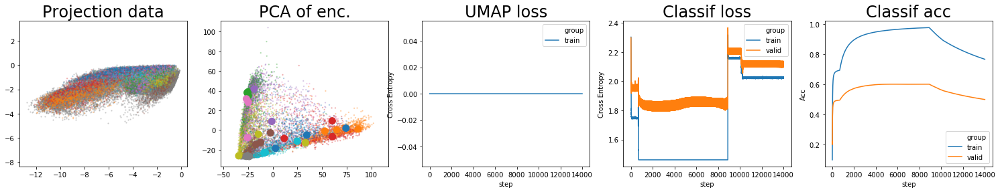

train acc: 0.7661 | val acc: 0.4989


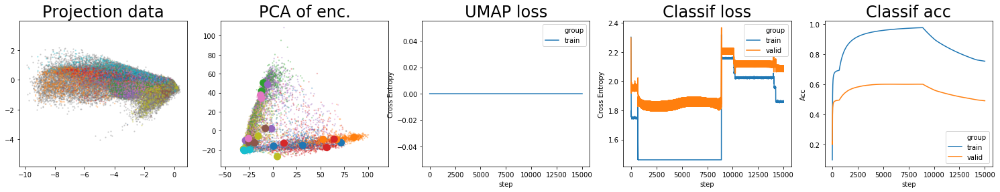

train acc: 0.7532 | val acc: 0.4903


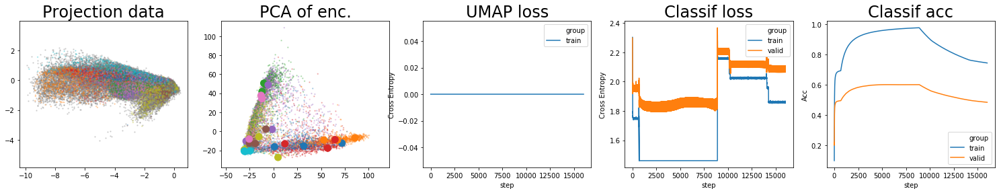

train acc: 0.7436 | val acc: 0.4836


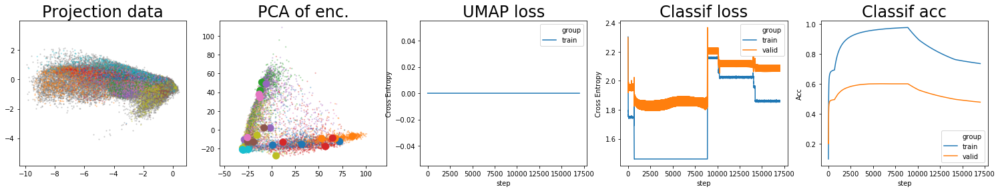

train acc: 0.7352 | val acc: 0.4777


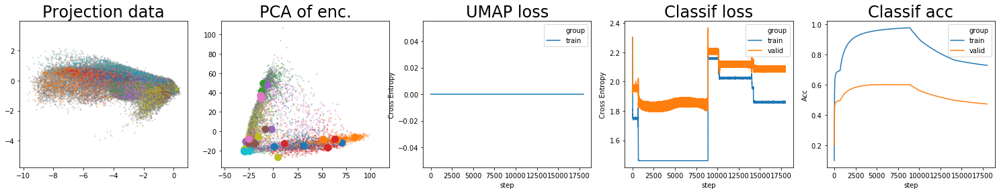

train acc: 0.7277 | val acc: 0.4725


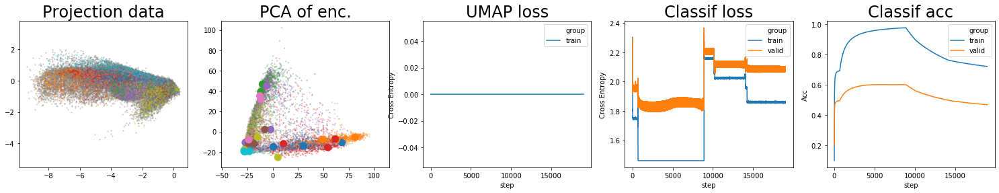

train acc: 0.7209 | val acc: 0.4678


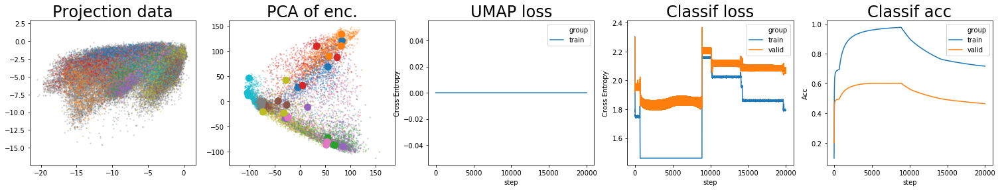

train acc: 0.716 | val acc: 0.4637


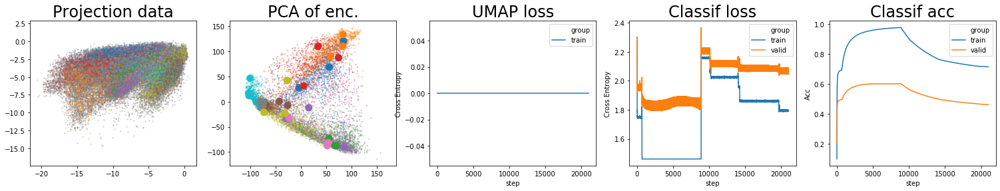

train acc: 0.7137 | val acc: 0.4605


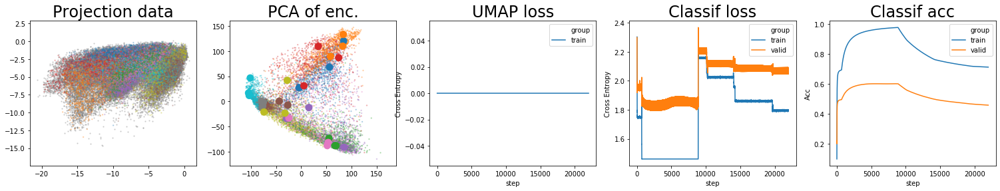

train acc: 0.7115 | val acc: 0.4575


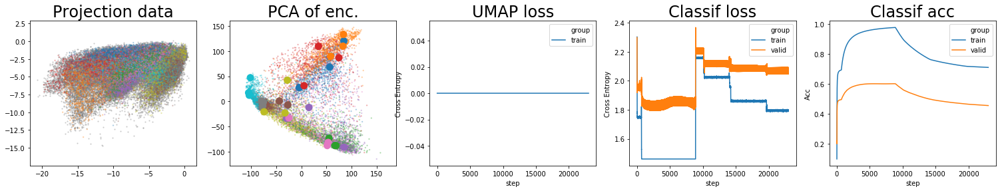

train acc: 0.7096 | val acc: 0.4549


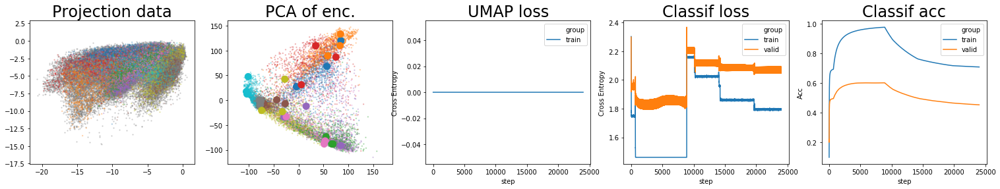

train acc: 0.7078 | val acc: 0.4524


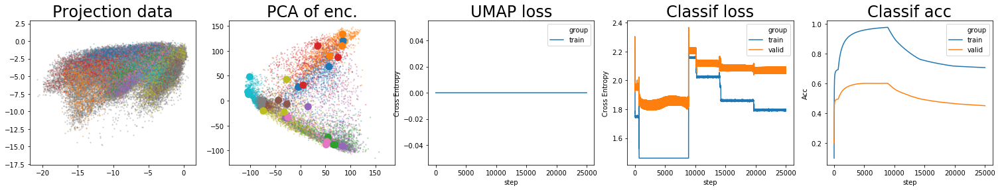

train acc: 0.7061 | val acc: 0.4502


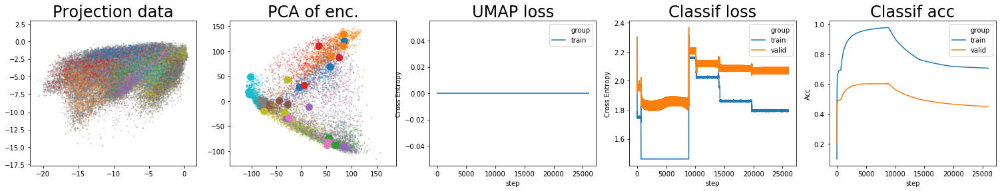

train acc: 0.7046 | val acc: 0.4481


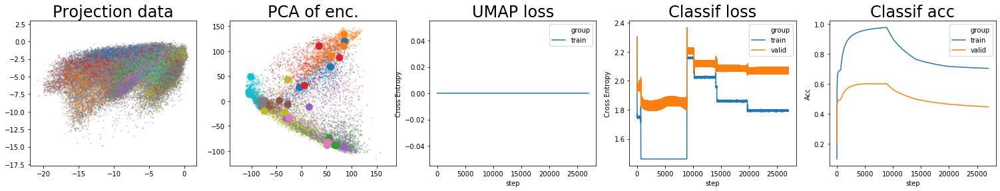

train acc: 0.7032 | val acc: 0.4462


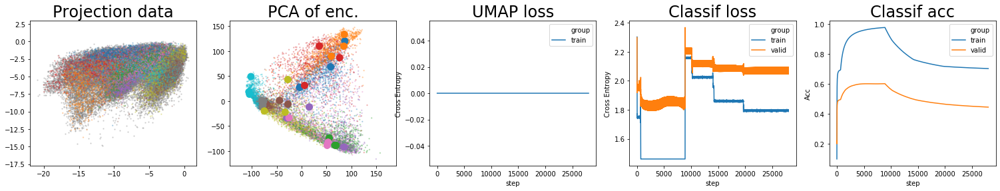

train acc: 0.7019 | val acc: 0.4444


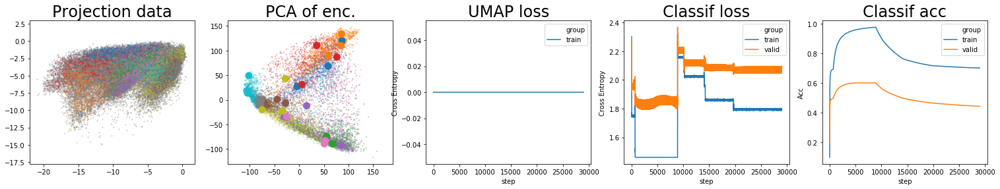

train acc: 0.7007 | val acc: 0.4427


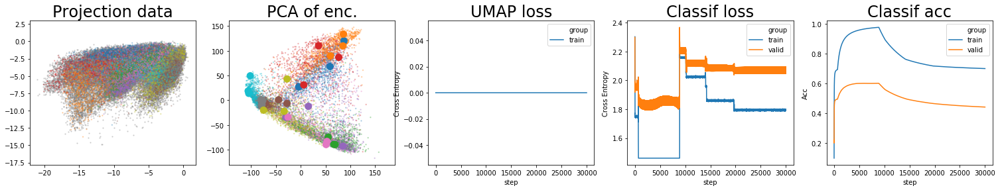

train acc: 0.6996 | val acc: 0.4411


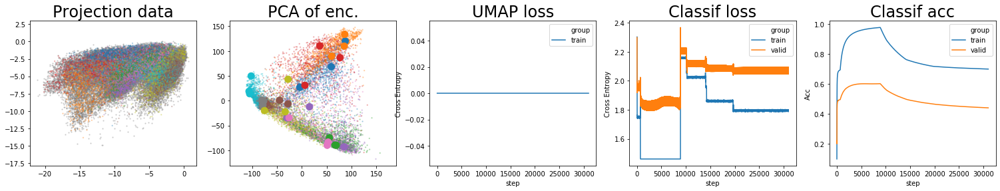

train acc: 0.6985 | val acc: 0.4396


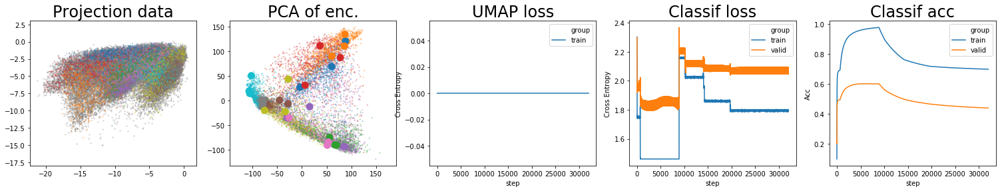

train acc: 0.6975 | val acc: 0.4382


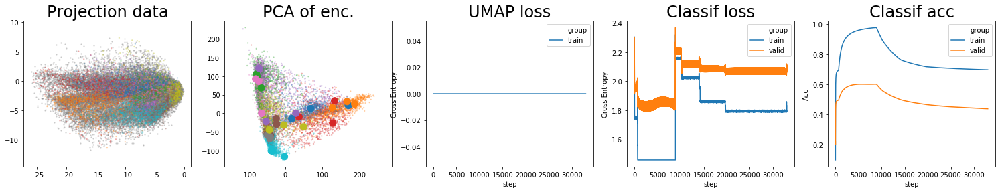

train acc: 0.6966 | val acc: 0.4369


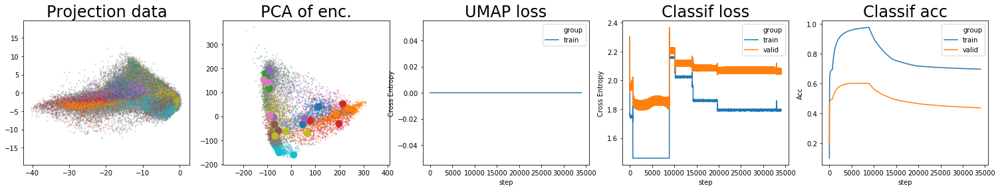

train acc: 0.6957 | val acc: 0.436


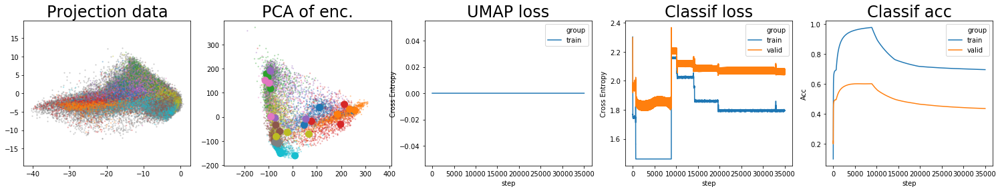

train acc: 0.6948 | val acc: 0.4351


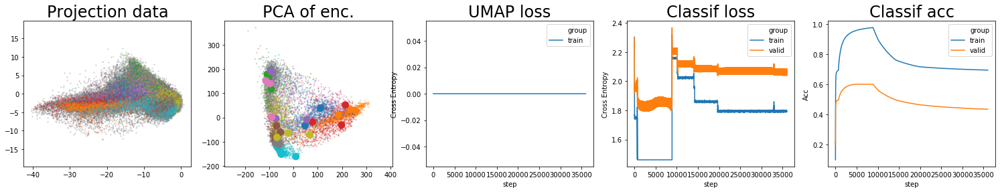

train acc: 0.6941 | val acc: 0.4342


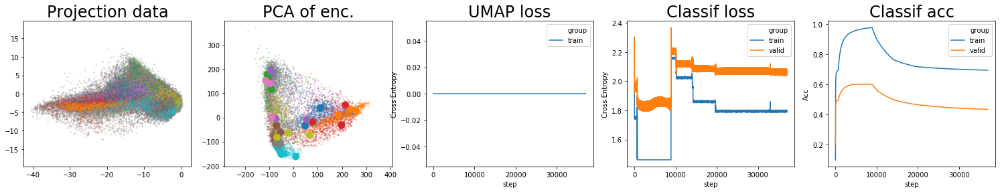

train acc: 0.6933 | val acc: 0.4334


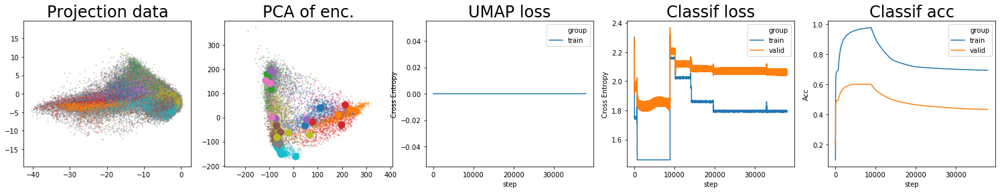

train acc: 0.6926 | val acc: 0.4326


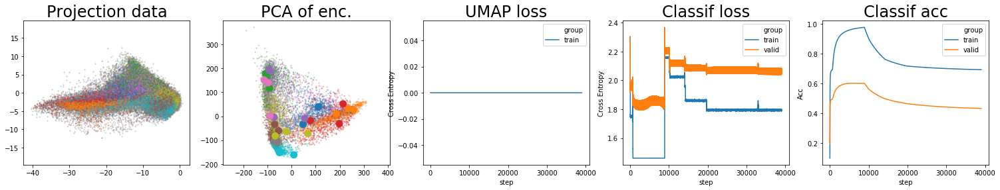

train acc: 0.692 | val acc: 0.4319


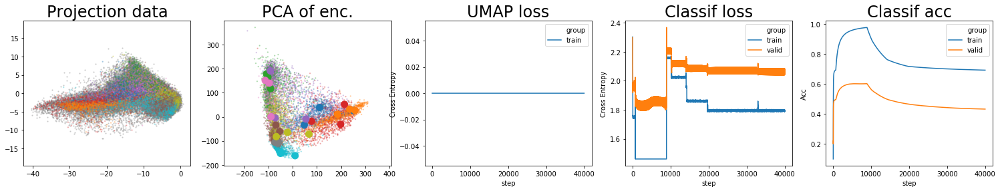

train acc: 0.6913 | val acc: 0.4312


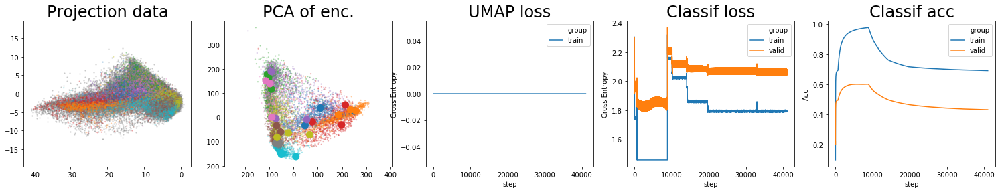

train acc: 0.6907 | val acc: 0.4305


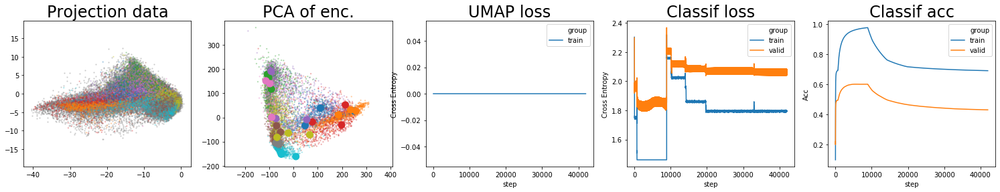

train acc: 0.6901 | val acc: 0.4299


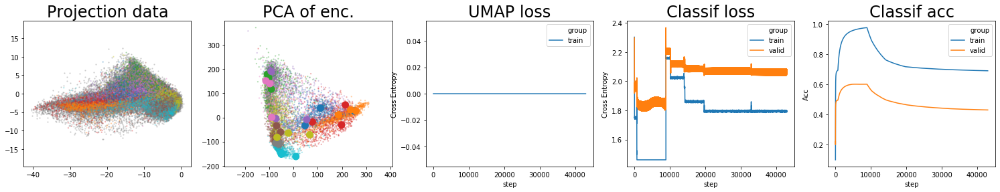

train acc: 0.6896 | val acc: 0.4293


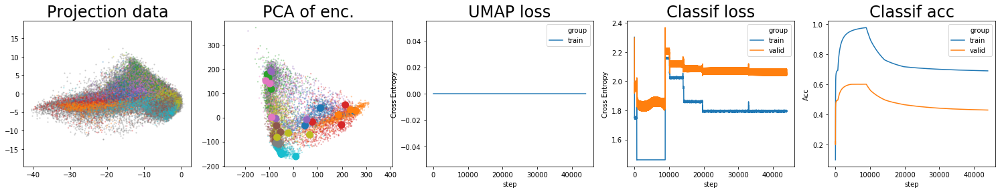

train acc: 0.6891 | val acc: 0.4288


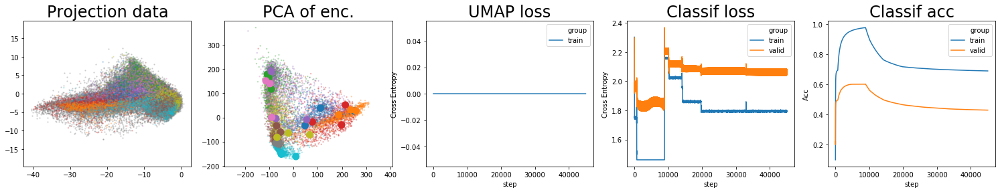

train acc: 0.6886 | val acc: 0.4282


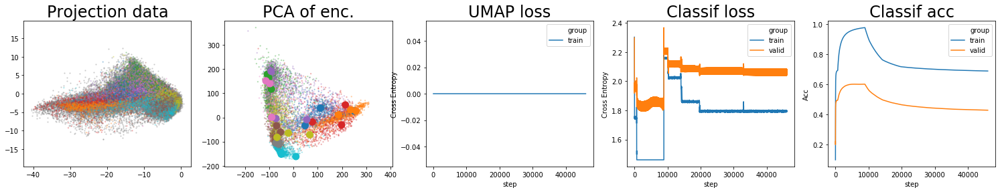

train acc: 0.6881 | val acc: 0.4277


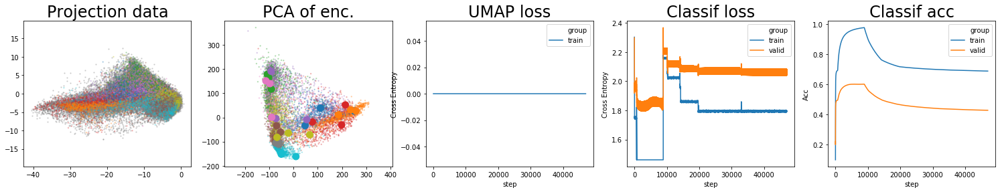

train acc: 0.6877 | val acc: 0.4272


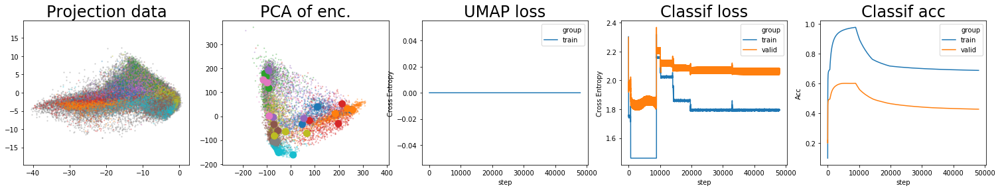

train acc: 0.6872 | val acc: 0.4268


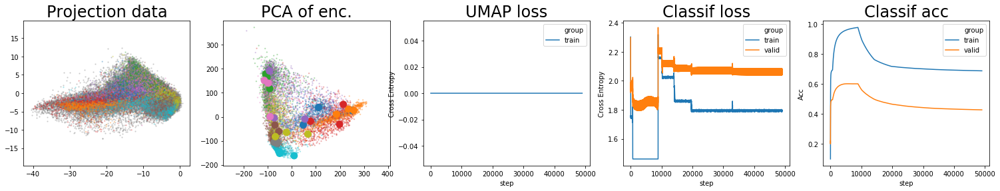

train acc: 0.6868 | val acc: 0.4263


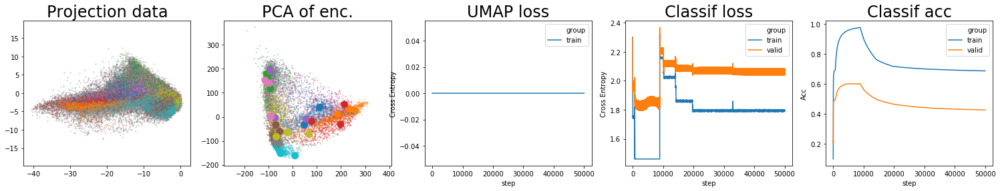

train acc: 0.6864 | val acc: 0.4259


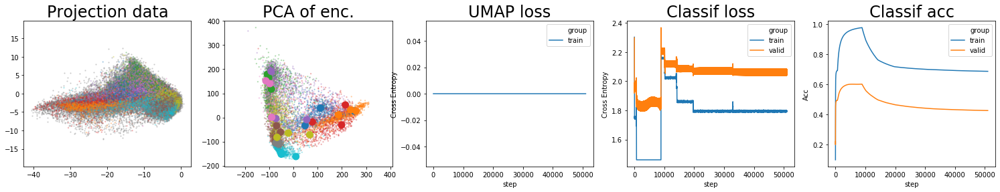

train acc: 0.686 | val acc: 0.4255


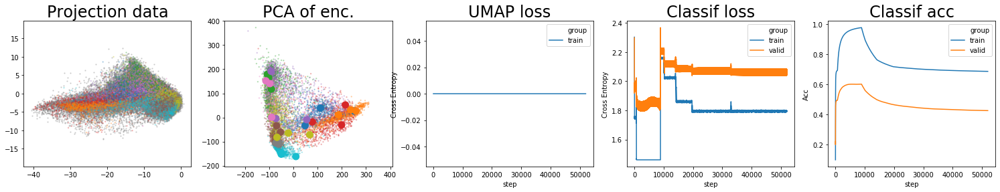

train acc: 0.6856 | val acc: 0.4251


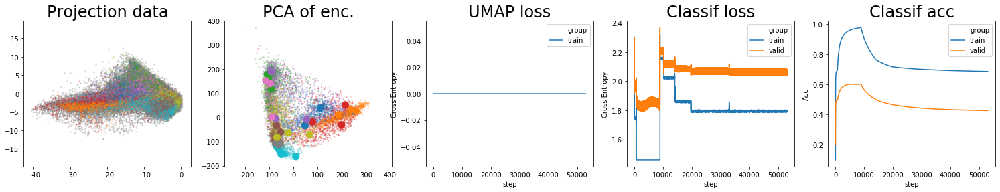

train acc: 0.6853 | val acc: 0.4247


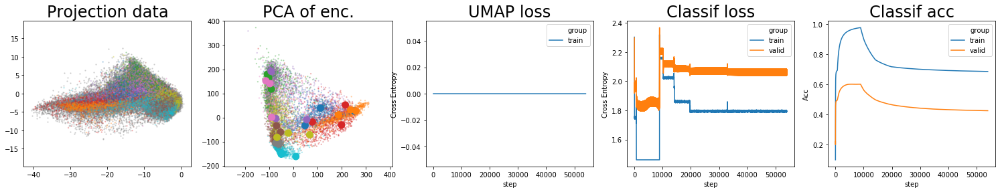

train acc: 0.6849 | val acc: 0.4244


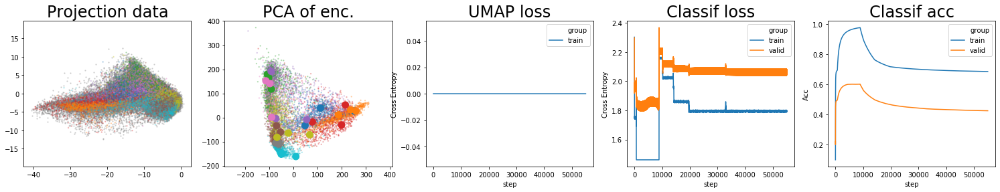

train acc: 0.6846 | val acc: 0.424


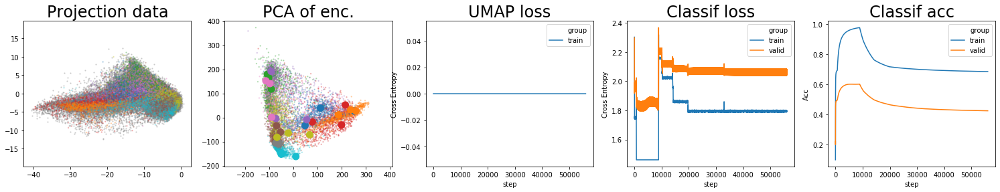

train acc: 0.6843 | val acc: 0.4237


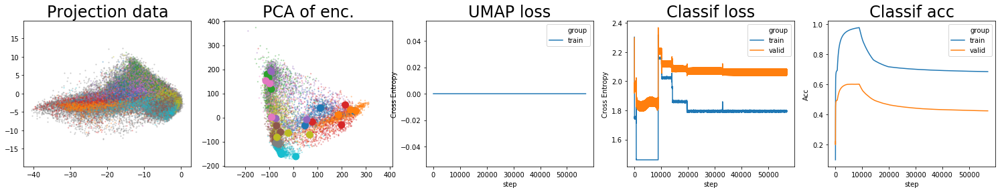

train acc: 0.684 | val acc: 0.4234


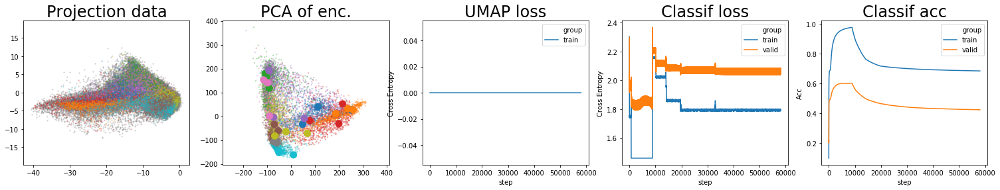

train acc: 0.6837 | val acc: 0.4231


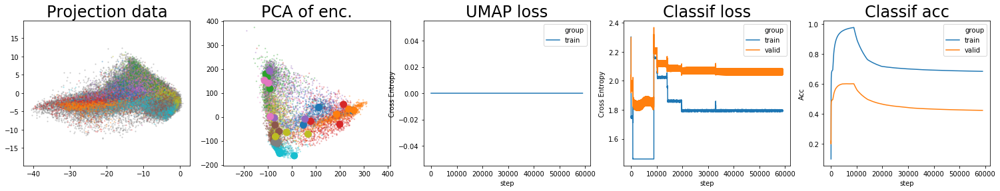

train acc: 0.6834 | val acc: 0.4228


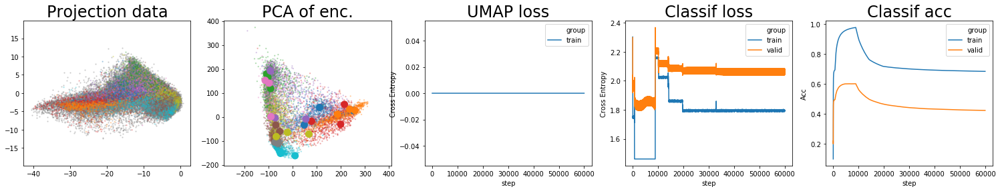

train acc: 0.6831 | val acc: 0.4225


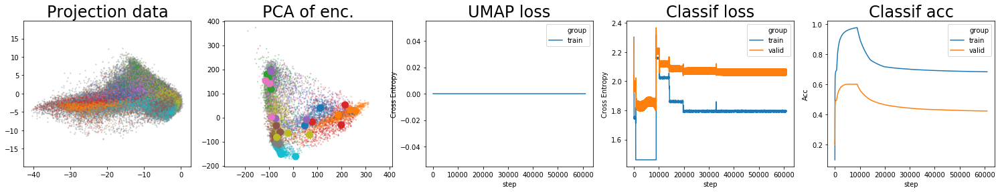

train acc: 0.6828 | val acc: 0.4222


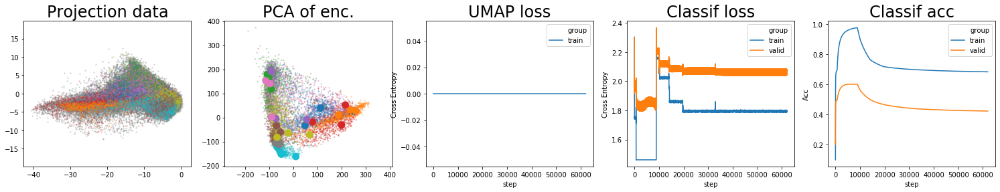

train acc: 0.6826 | val acc: 0.422


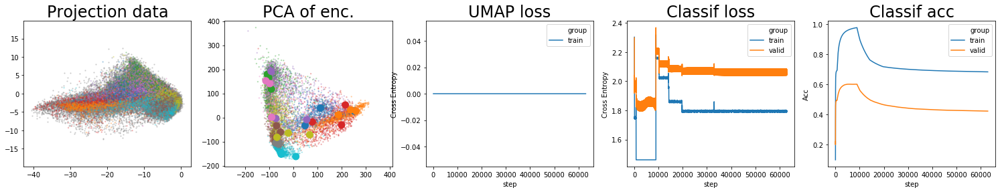

train acc: 0.6823 | val acc: 0.4217


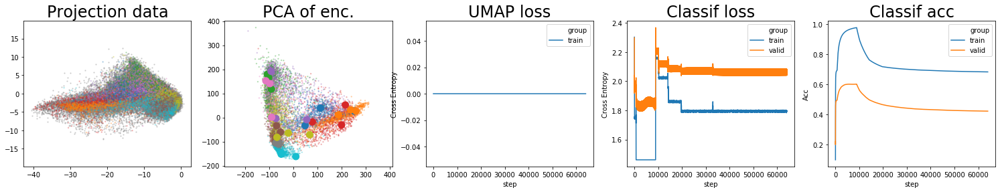

train acc: 0.6821 | val acc: 0.4215


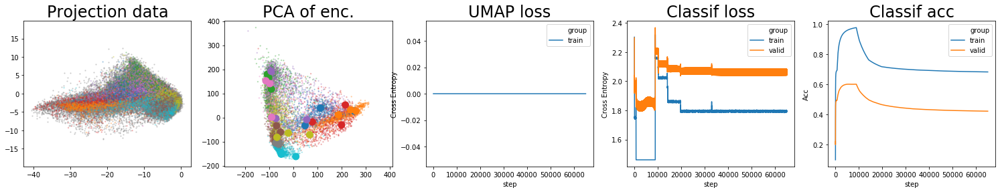

train acc: 0.6818 | val acc: 0.4212


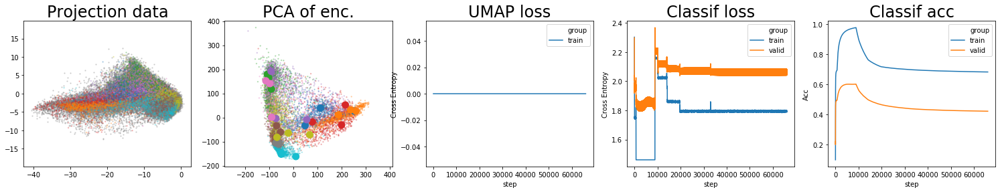

train acc: 0.6816 | val acc: 0.421


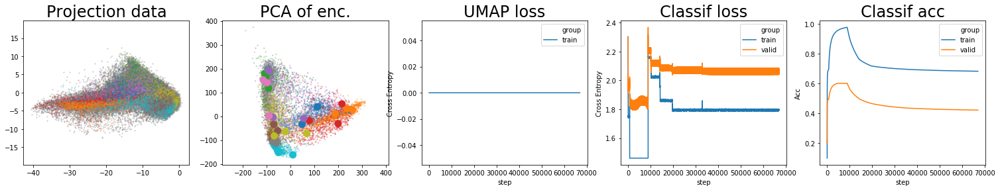

train acc: 0.6814 | val acc: 0.4207


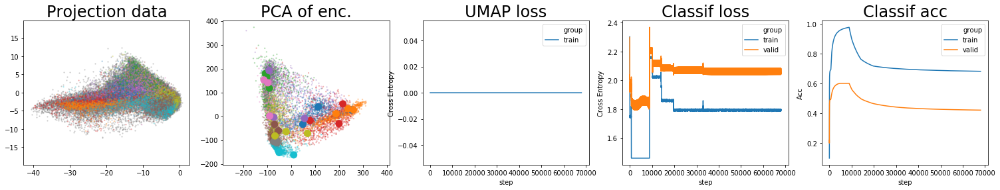

train acc: 0.6812 | val acc: 0.4205


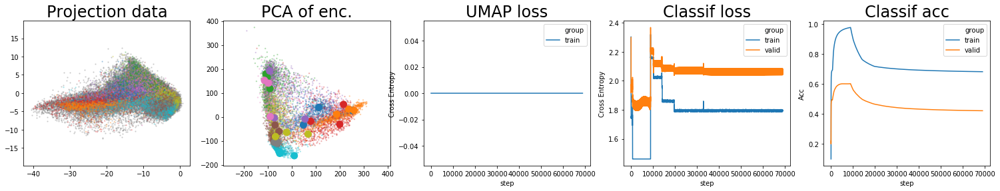

train acc: 0.681 | val acc: 0.4203


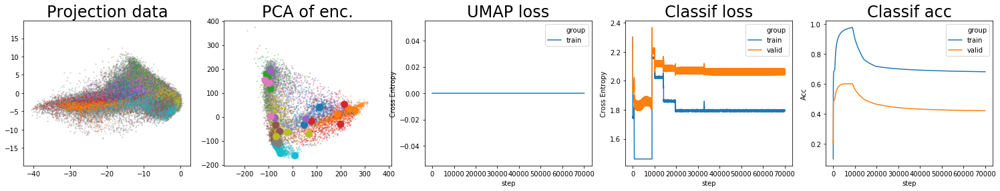

train acc: 0.6808 | val acc: 0.4201


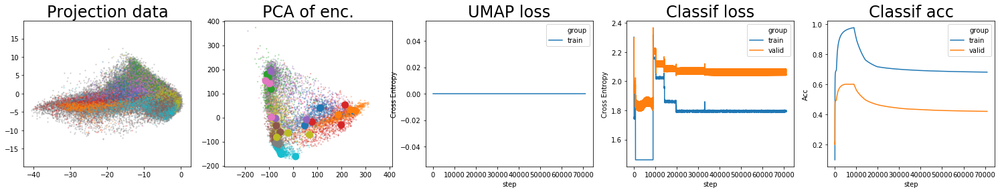

train acc: 0.6806 | val acc: 0.4199


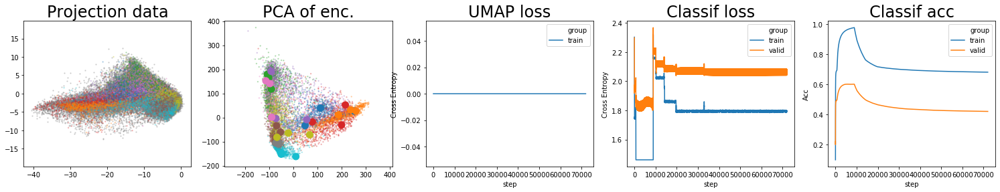

train acc: 0.6804 | val acc: 0.4197


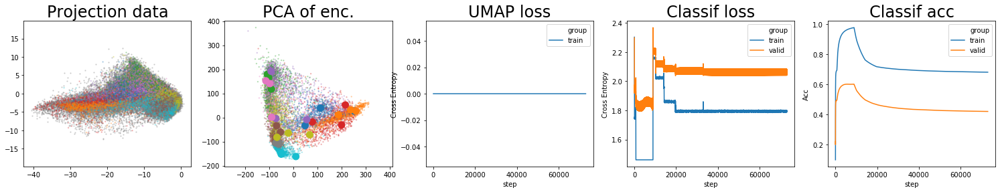

train acc: 0.6802 | val acc: 0.4195


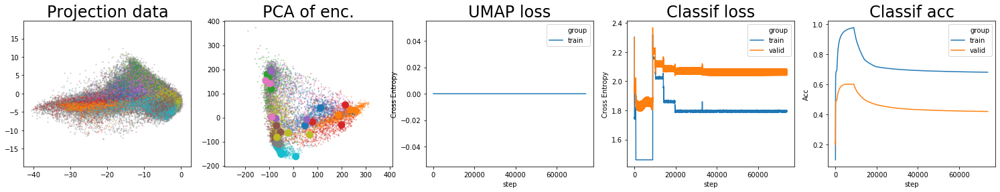

train acc: 0.68 | val acc: 0.4193


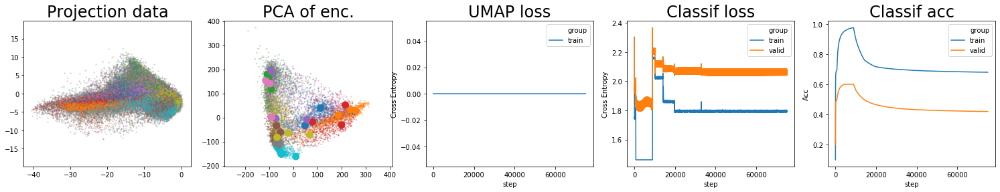

train acc: 0.6798 | val acc: 0.4191


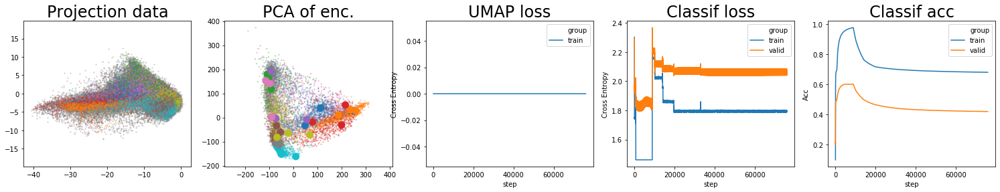

train acc: 0.6796 | val acc: 0.419


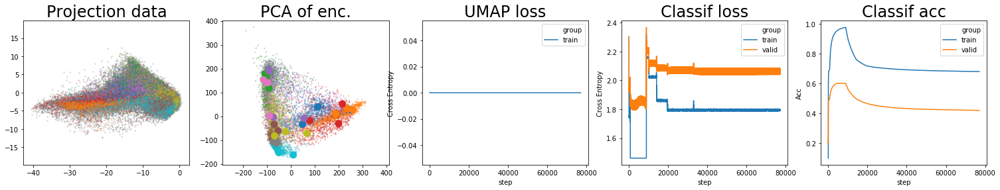

train acc: 0.6795 | val acc: 0.4188


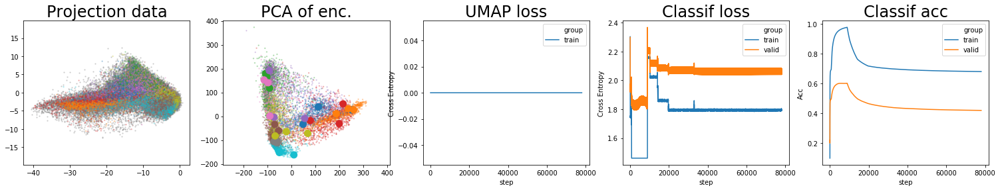

train acc: 0.6793 | val acc: 0.4186


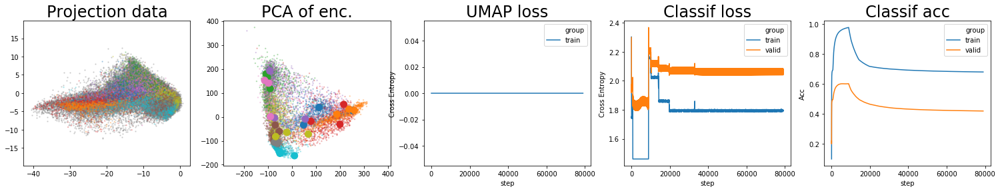

train acc: 0.6791 | val acc: 0.4184


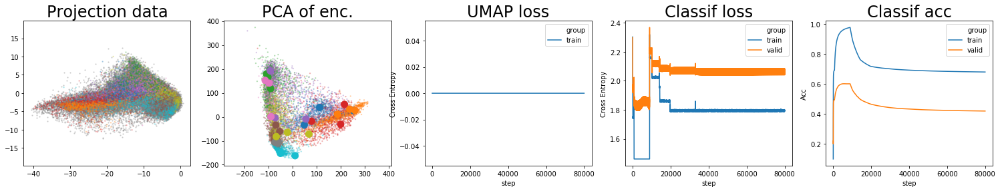

train acc: 0.679 | val acc: 0.4183


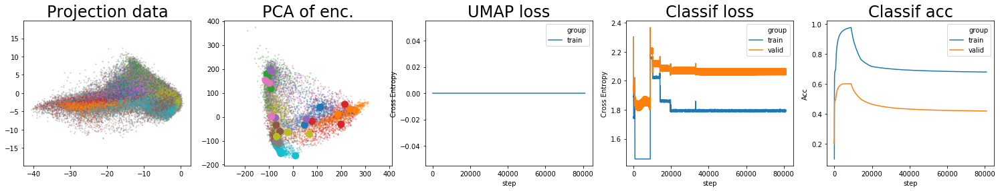

train acc: 0.6788 | val acc: 0.4181


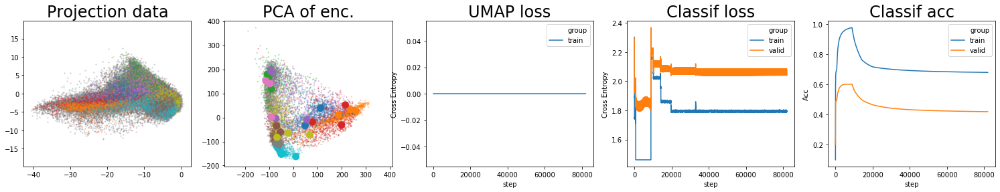

train acc: 0.6787 | val acc: 0.418


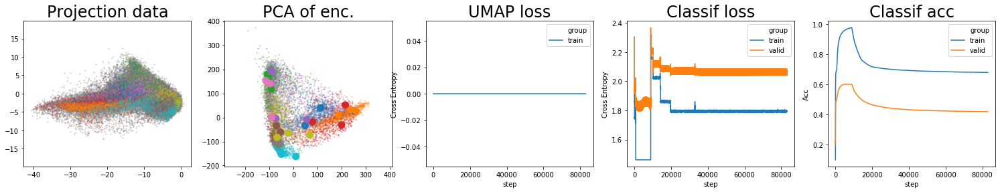

train acc: 0.6785 | val acc: 0.4178


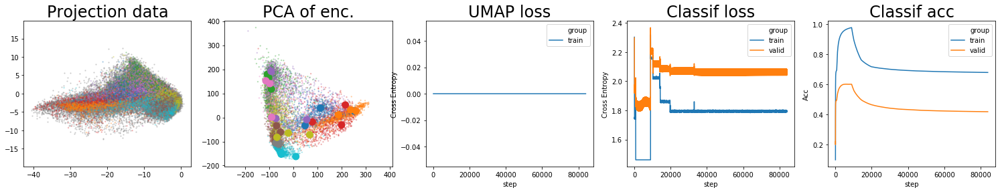

train acc: 0.6784 | val acc: 0.4177


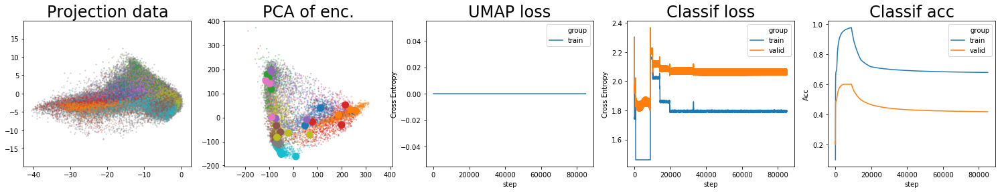

train acc: 0.6783 | val acc: 0.4175


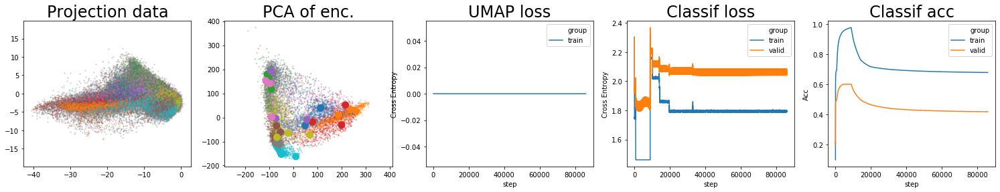

train acc: 0.6781 | val acc: 0.4174


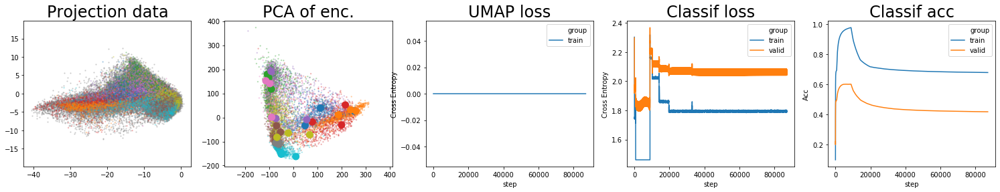

train acc: 0.678 | val acc: 0.4173


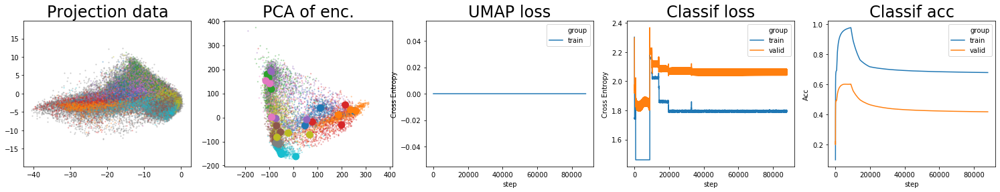

train acc: 0.6779 | val acc: 0.4171


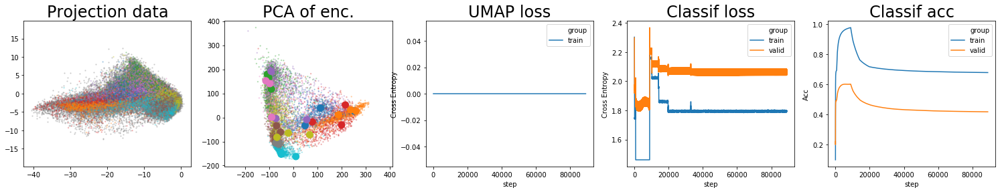

train acc: 0.6777 | val acc: 0.417


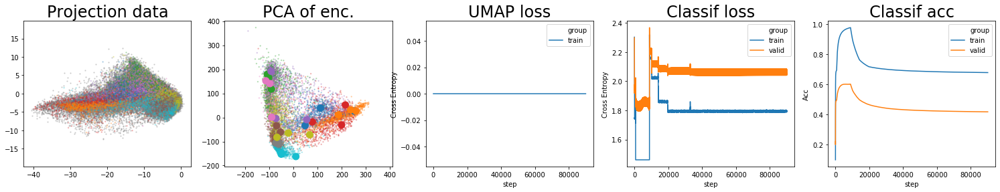

train acc: 0.6776 | val acc: 0.4169


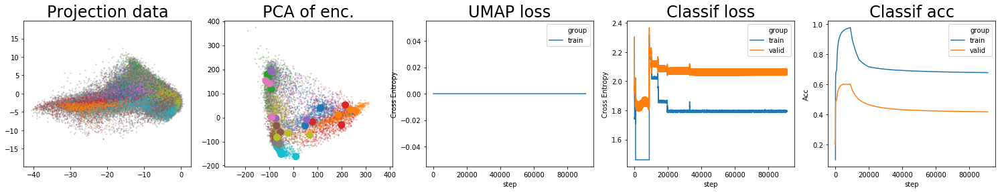

train acc: 0.6775 | val acc: 0.4168


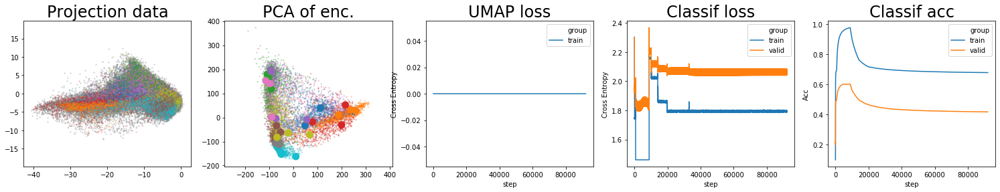

train acc: 0.6774 | val acc: 0.4166


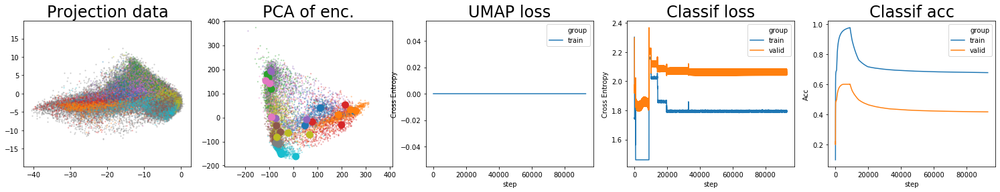

train acc: 0.6773 | val acc: 0.4165


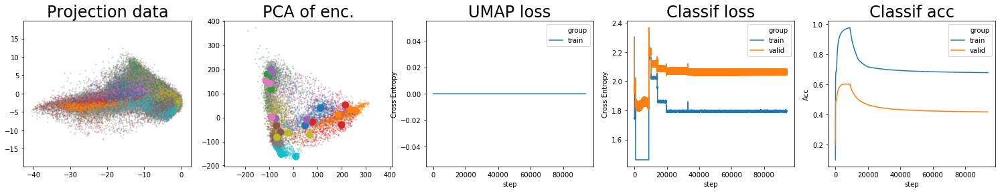

train acc: 0.6772 | val acc: 0.4164


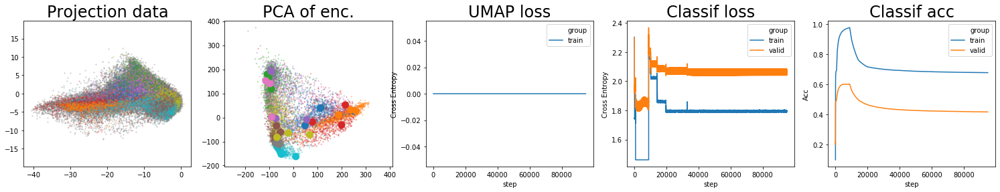

train acc: 0.677 | val acc: 0.4163


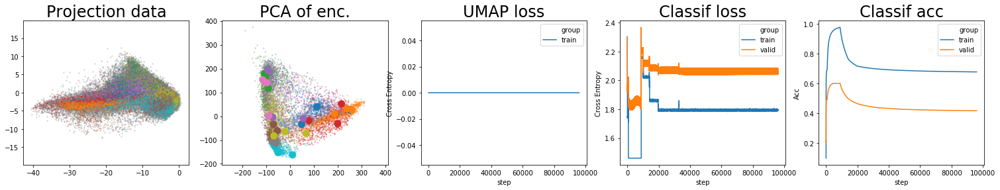

train acc: 0.6769 | val acc: 0.4162


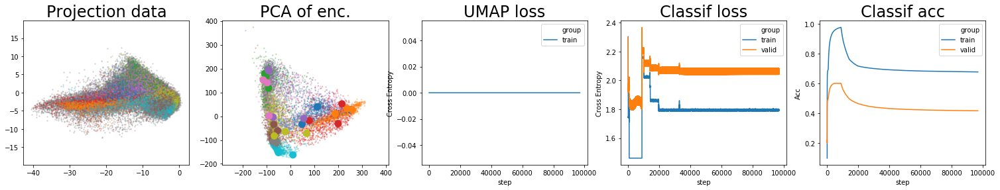

train acc: 0.6768 | val acc: 0.4161


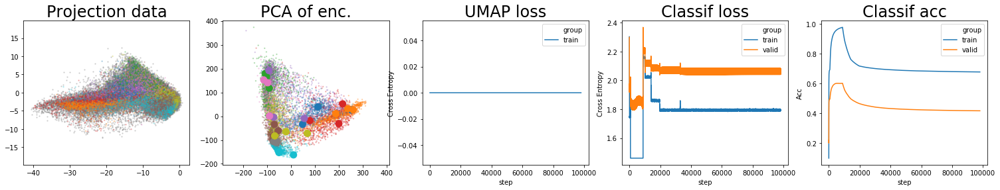

train acc: 0.6767 | val acc: 0.416


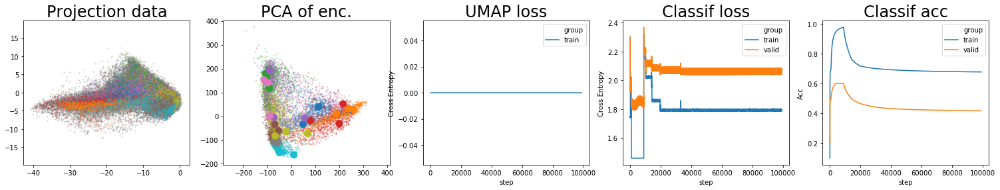

train acc: 0.6766 | val acc: 0.4159


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


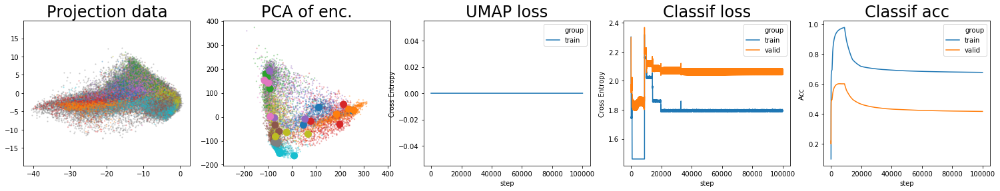

train acc: 0.6765 | val acc: 0.4158


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


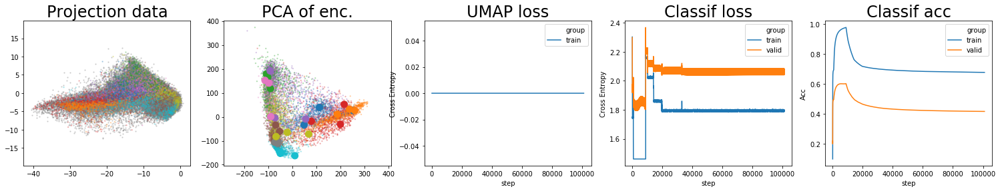

train acc: 0.6764 | val acc: 0.4157


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


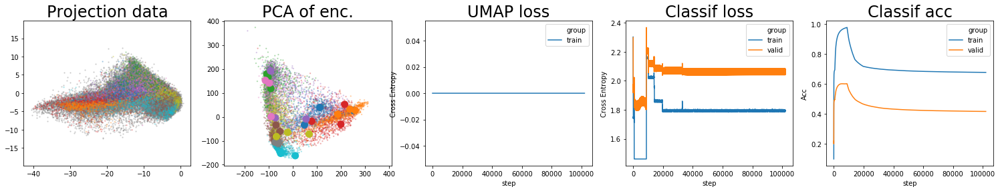

train acc: 0.6763 | val acc: 0.4156


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


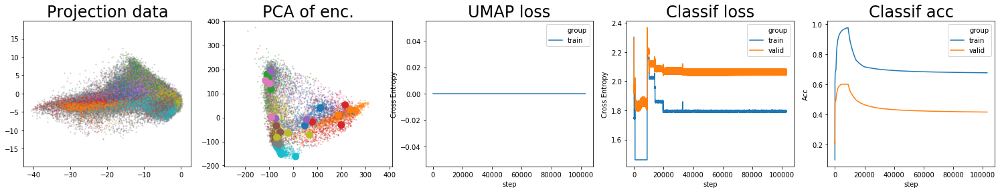

train acc: 0.6762 | val acc: 0.4155


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


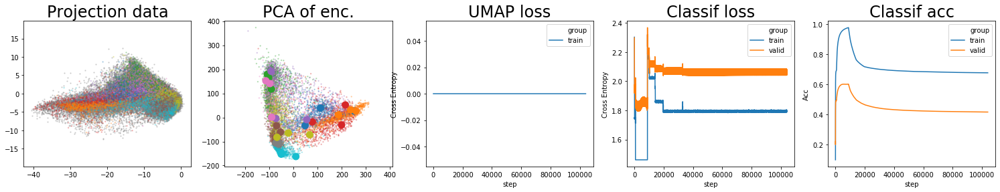

train acc: 0.6761 | val acc: 0.4154


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


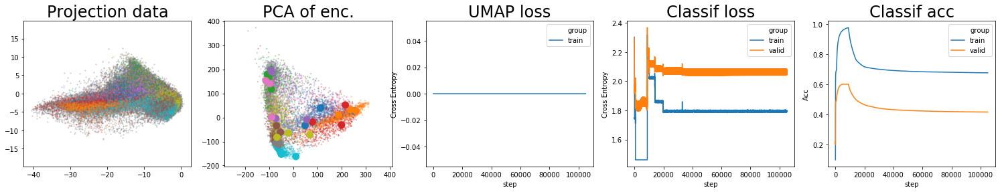

train acc: 0.676 | val acc: 0.4154


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


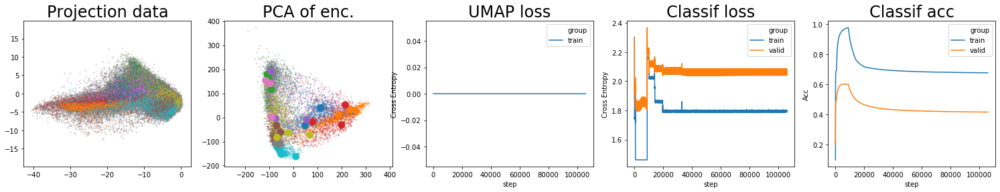

train acc: 0.676 | val acc: 0.4153


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


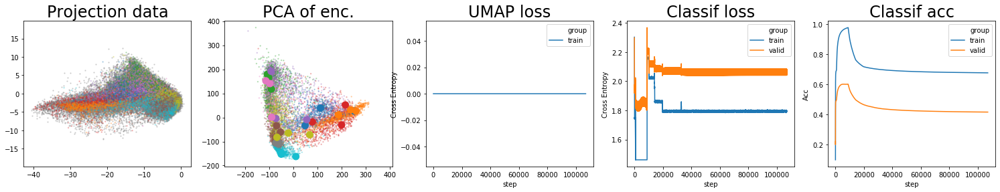

train acc: 0.6759 | val acc: 0.4152


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


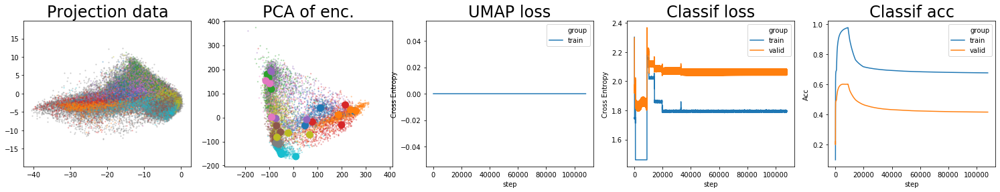

train acc: 0.6758 | val acc: 0.4151


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


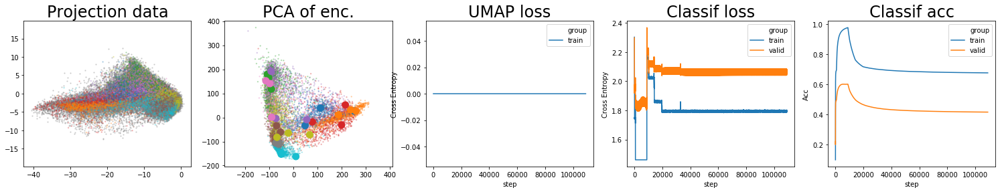

train acc: 0.6757 | val acc: 0.415


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


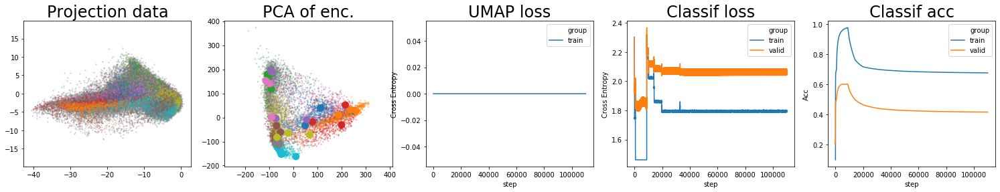

train acc: 0.6756 | val acc: 0.415


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


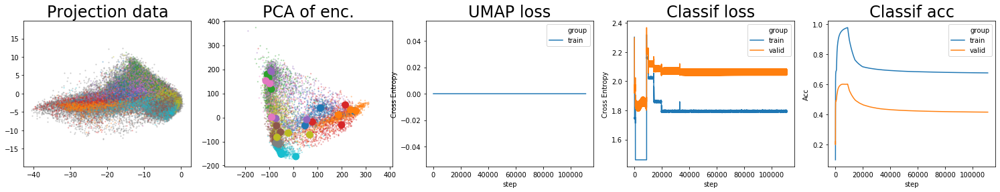

train acc: 0.6755 | val acc: 0.4149


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


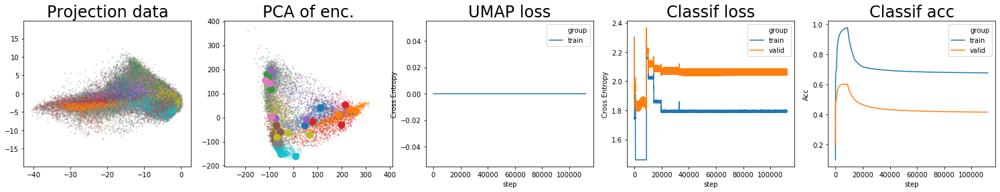

train acc: 0.6754 | val acc: 0.4148


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


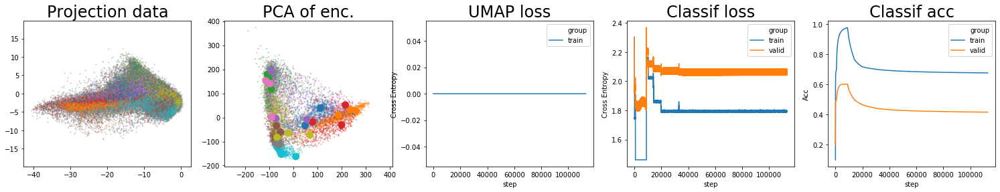

train acc: 0.6754 | val acc: 0.4147


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


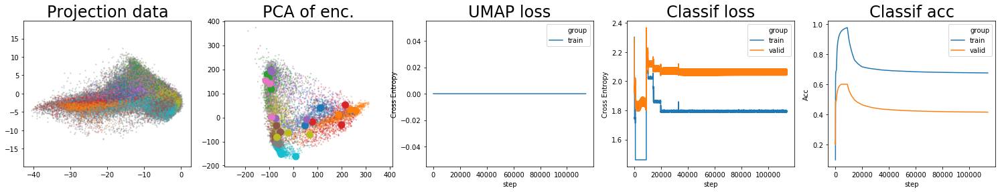

train acc: 0.6753 | val acc: 0.4147


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


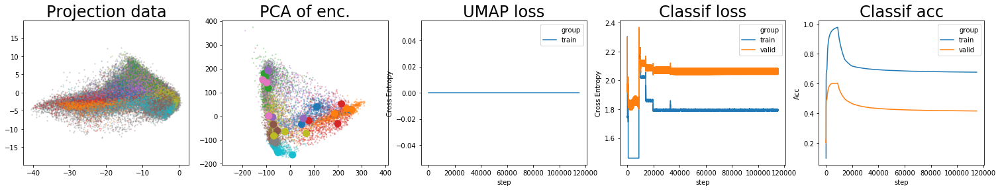

train acc: 0.6752 | val acc: 0.4146


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


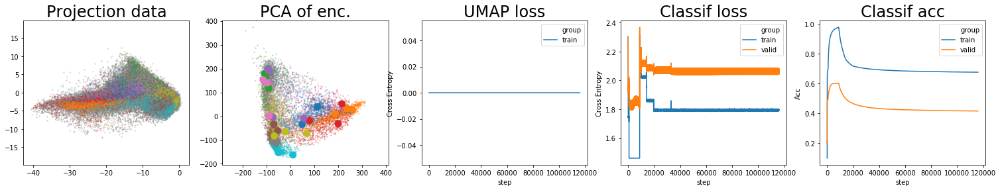

train acc: 0.6751 | val acc: 0.4145


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


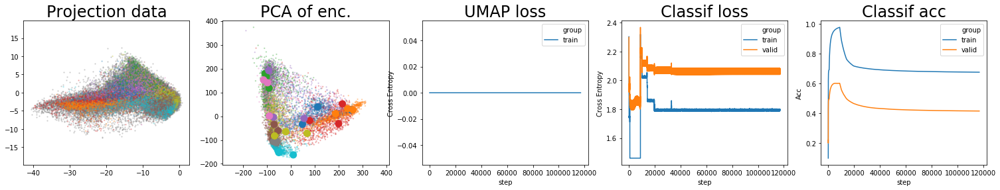

train acc: 0.6751 | val acc: 0.4144


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


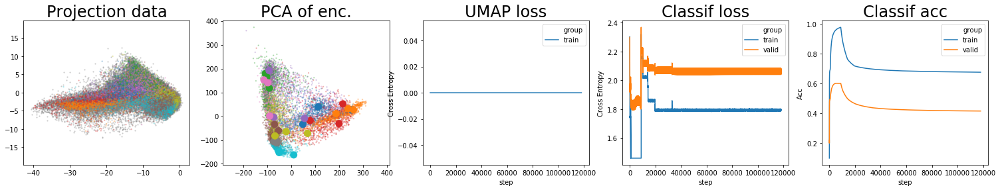

train acc: 0.675 | val acc: 0.4144


/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


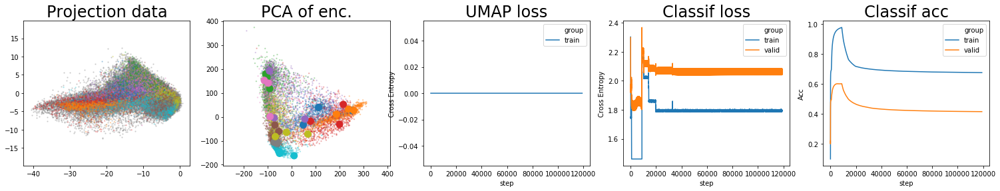

train acc: 0.6749 | val acc: 0.4143


In [ ]:
for edge_epoch, epoch in tqdm(zip(edge_iter, np.arange(N_EPOCHS)), total=N_EPOCHS):
    for (batch_to, batch_from), (X, y), (X_val, y_val) in tqdm(
        zip(edge_epoch, labeled_iter, data_valid), total=BATCHES_PER_EPOCH, leave=False
    ):

        # train
        (
            attraction_loss,
            repellant_loss,
            umap_loss,
            classifier_loss,
            classifier_acc,
        ) = model.train(
            batch_to=X_train[batch_to], batch_from=X_train[batch_from], X=X, y=y
        )

        # compute validation loss
        val_loss, val_acc = compute_classifier_loss(
            X_val,
            y_val,
            model.encoder,
            model.classifier,
            model.sparse_ce,
            model.class_acc_val,
        )

        # save losses
        model.write_losses(
            tf.convert_to_tensor(batch, dtype=tf.int64),
            classifier_acc,
            classifier_loss,
            umap_loss,
            val_loss,
            val_acc,
        )

        if batch % 1000 == 0:
            plot_umap_classif_results(
                model,
                X_valid,
                Y_valid,
                X_train,
                X_labeled,
                Y_labeled,
                batch_size,
                cmap="tab10",
                cmap2="tab10",
            )
            print("train acc: {} | val acc: {}".format(str(round(classifier_acc.numpy(),4)), str(round(val_acc.numpy(),4))))
        batch += 1

In [ ]:
classifier_acc, classifier_loss

In [ ]:
val_acc, val_loss